[출처](https://blog.naver.com/youji4ever/221623491491)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/psychopath_data/PersonalityData_ExternalVersion001.csv')

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore,spearmanr,shapiro
from sklearn.preprocessing import MinMaxScaler , StandardScaler , RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression , Lasso
from sklearn.metrics import mean_squared_log_error , r2_score , mean_squared_error , mean_absolute_error
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor

In [ ]:
data['Var20'] = pd.to_numeric(data['Var20'] , errors = 'coerce')
data = data.drop(['uid'] , axis = 1)

In [ ]:
pd.set_option('display.max_row', None)
is_null = data.isna().sum(axis = 1)
data['cnt_null'] = is_null
data['cnt_null'].value_counts()

,count
cnt_null,
0,2467
91,188
1,133
90,114
79,12
98,11
80,1
81,1


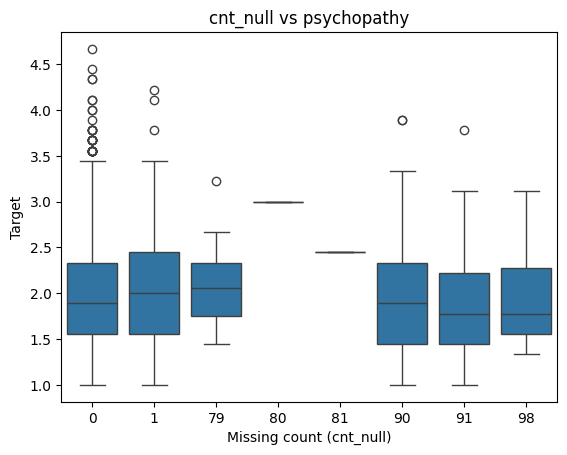

In [ ]:
# 결측 개수 vs target 관계 시각화 (회귀 타겟 기준)
sns.boxplot(x=data['cnt_null'], y=data['psychopathy'])
plt.title('cnt_null vs psychopathy')
plt.xlabel('Missing count (cnt_null)')
plt.ylabel('Target')
plt.show()


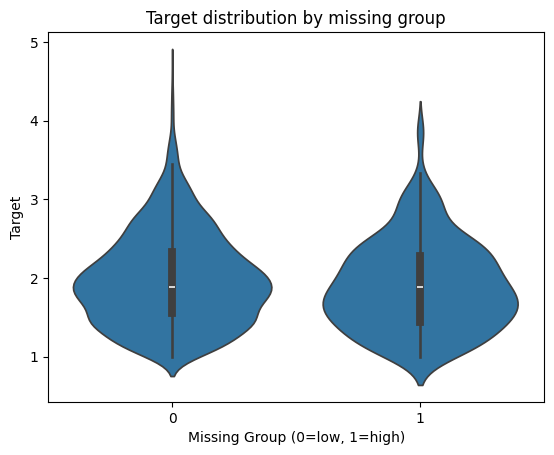

Text(0, 0.5, 'Target')

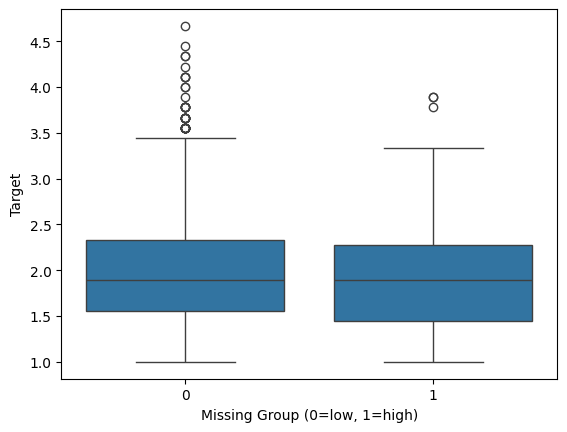

In [ ]:
# 고결측/저결측으로 그룹 분리
missing_group= (data['cnt_null'] >= 80).astype(int)

sns.violinplot(x=missing_group, y='psychopathy', data=data)
plt.title('Target distribution by missing group')
plt.xlabel('Missing Group (0=low, 1=high)')
plt.ylabel('Target')
plt.show()

sns.boxplot(x=missing_group, y='psychopathy', data=data)
plt.xlabel('Missing Group (0=low, 1=high)')
plt.ylabel('Target')

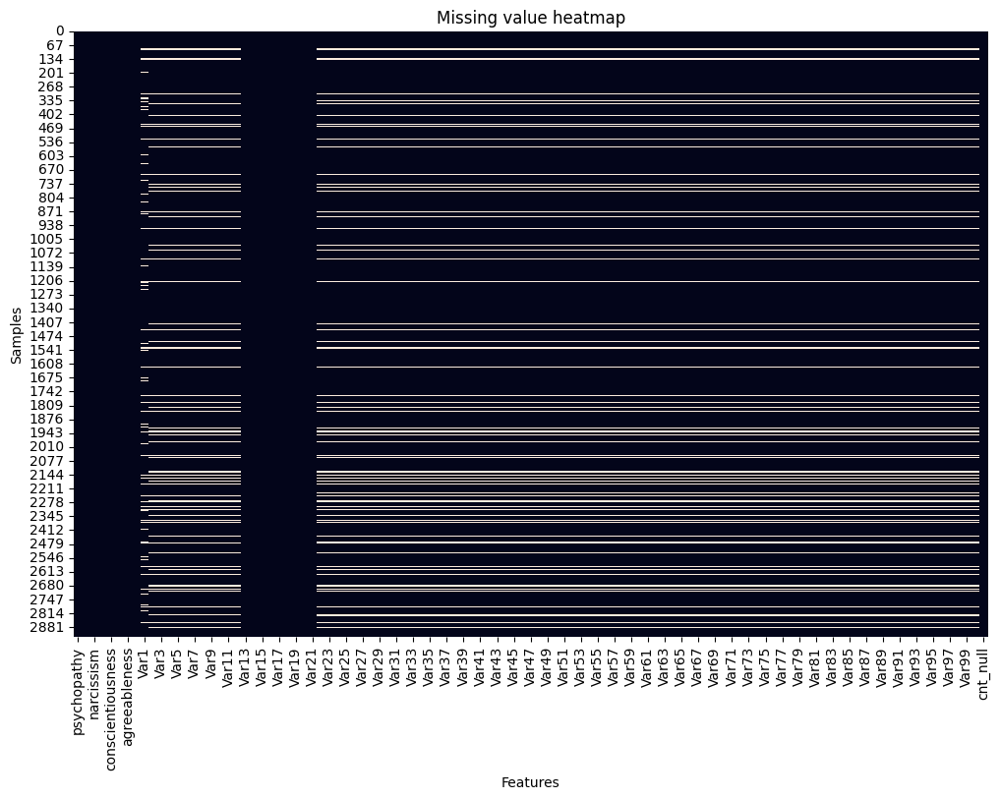

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.isna(), cbar=False)
plt.title('Missing value heatmap')
plt.xlabel('Features')
plt.ylabel('Samples')
plt.show()


In [ ]:
!pip install missingno

In [ ]:
import missingno as msno

<Axes: >

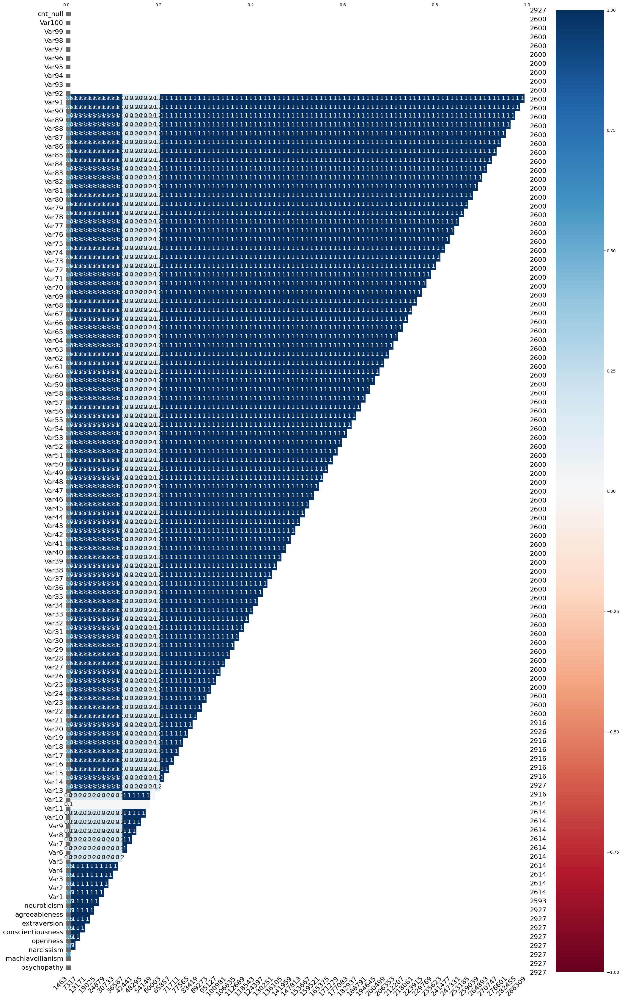

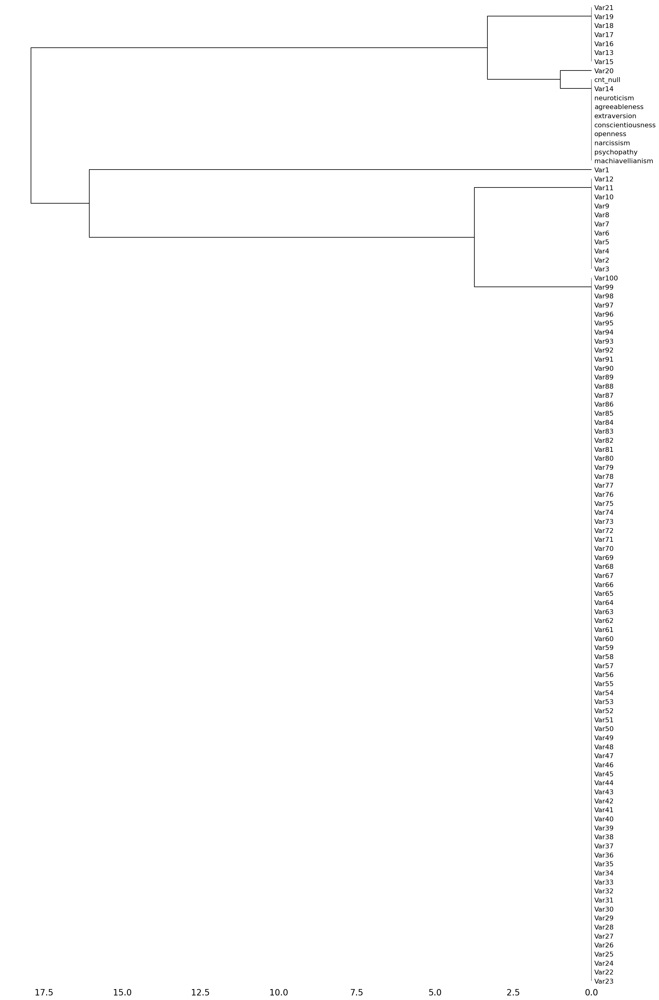

In [ ]:
msno.heatmap(data)
msno.bar(data)
msno.dendrogram(data)

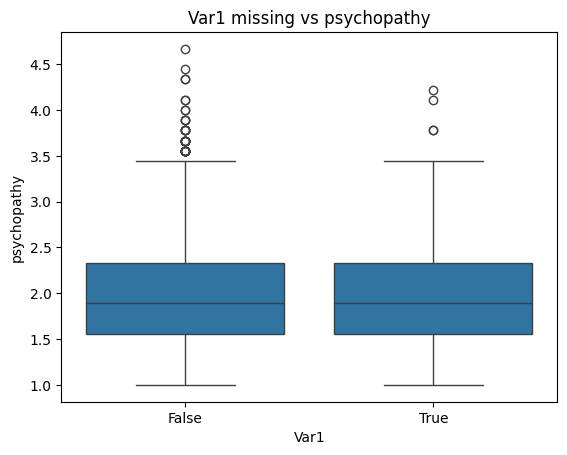

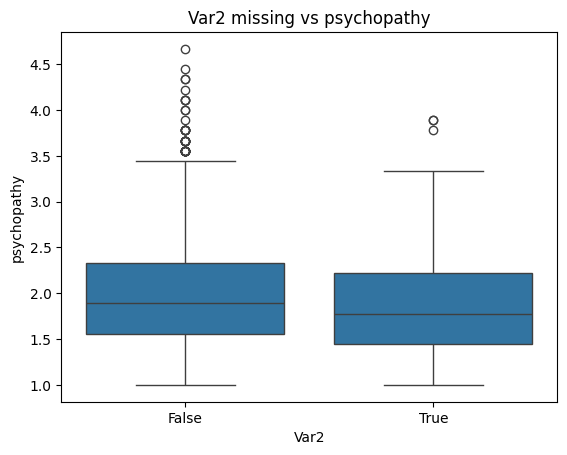

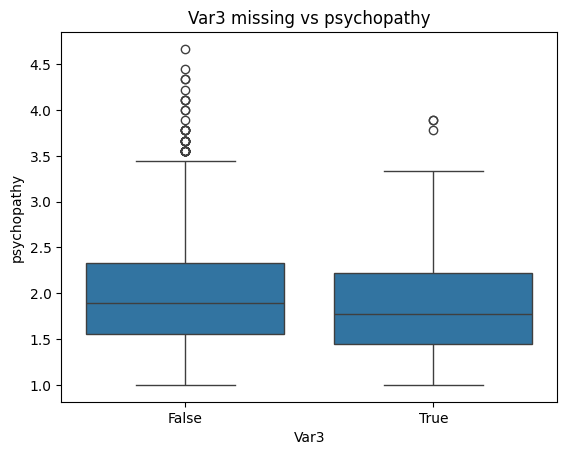

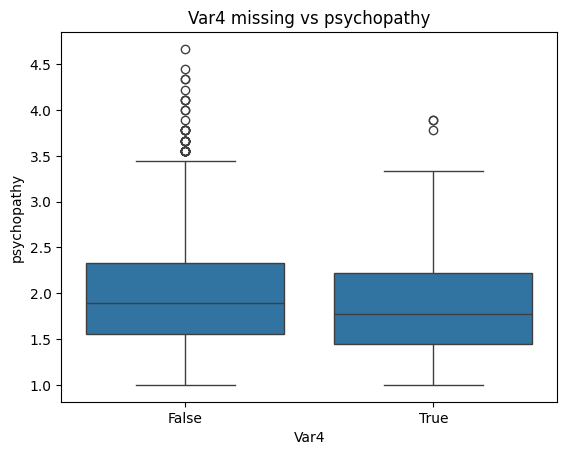

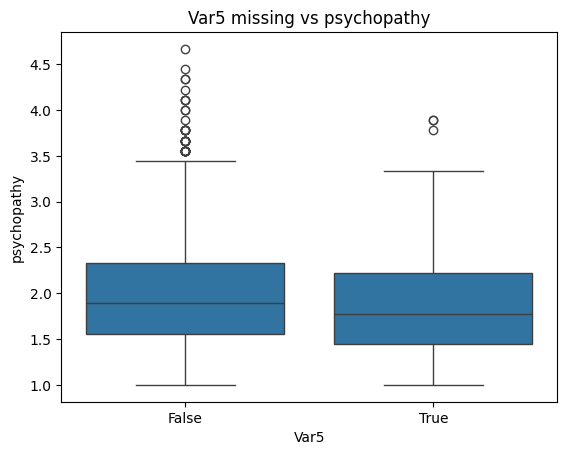

...

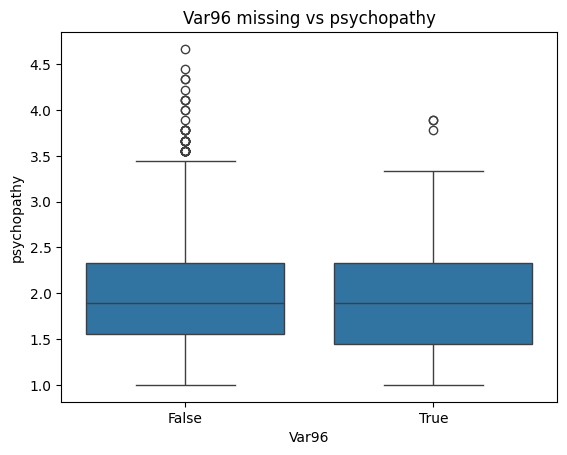

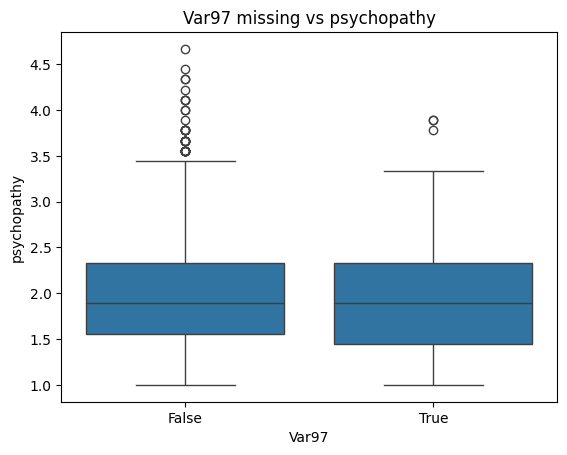

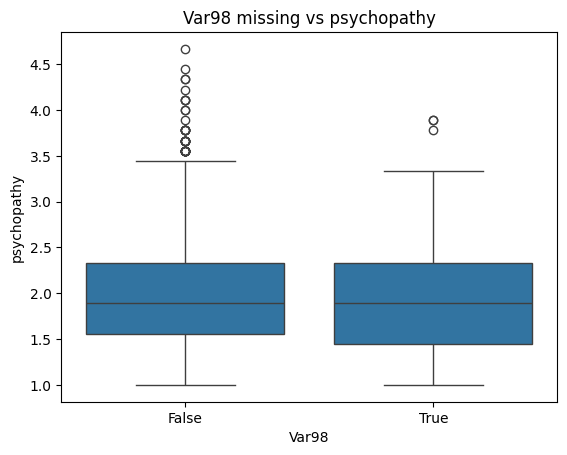

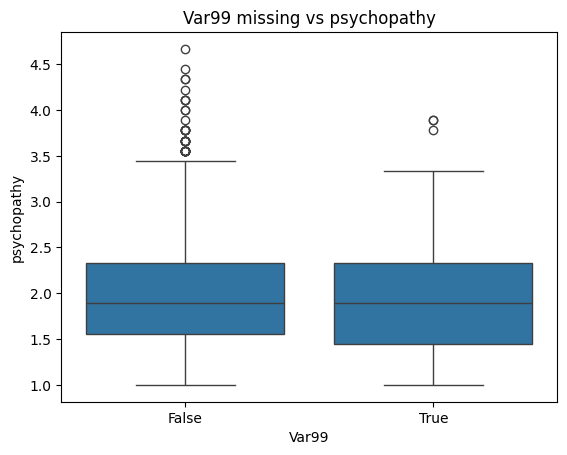

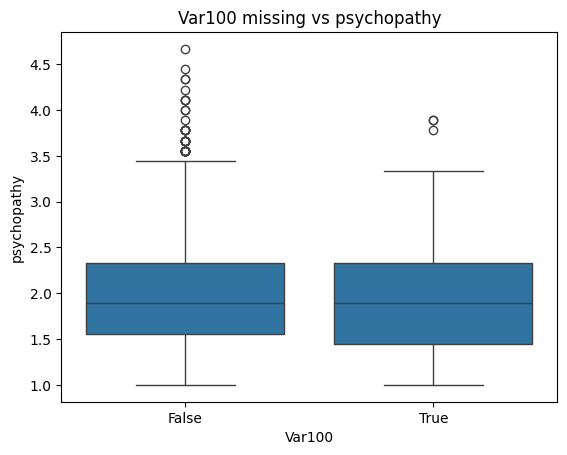

In [ ]:
for col in data.columns:
    if data[col].isna().sum() > 0:
        sns.boxplot(x=data[col].isna(), y=data['psychopathy'])
        plt.title(f"{col} missing vs psychopathy")
        plt.show()


In [ ]:
!pip install impyute

In [ ]:
# mice
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge


imputer = IterativeImputer(
    estimator= BayesianRidge(),
    max_iter = 10,
    random_state= 42)

df_imputer =pd.DataFrame(imputer.fit_transform(data) , columns= data.columns)

df_imputer.head(5)


,psychopathy,machiavellianism,narcissism,openness,conscientiousness,extraversion,agreeableness,neuroticism,Var1,Var2,...,Var92,Var93,Var94,Var95,Var96,Var97,Var98,Var99,Var100,cnt_null
0,2.444444,3.4,3.444444,7.0,6.0,5.5,3.5,3.5,48.59,0.0,...,1.31,2.05,0.66,0.92,1.14,4.37,0.71,15.11,45.70,0.0
1,1.888889,2.4,2.777778,7.0,4.5,6.0,3.0,5.5,41.29,0.0,...,0.04,0.46,2.34,2.99,0.38,1.46,2.83,21.90,53.49,0.0
2,1.111111,3.0,3.444444,5.5,6.0,6.0,6.5,3.0,14.65,0.0,...,0.20,2.63,1.72,0.64,0.42,2.74,0.11,10.13,32.77,0.0
3,1.888889,3.0,2.444444,5.0,3.5,2.0,6.5,1.5,17.60,0.0,...,0.16,1.43,2.42,1.07,1.67,3.46,0.35,5.65,32.67,0.0
4,2.111111,3.1,1.333333,6.0,5.5,2.5,5.5,5.0,52.63,9.0,...,0.08,1.14,0.38,0.85,1.05,4.67,0.38,8.34,34.25,0.0


In [ ]:
# features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']

for f in df_imputer.columns:
  correlation = df_imputer[['cnt_null', f]].corr().iloc[0, 1]
  print(f"Correlation between cnt_null and {f}: {correlation:.3f}")

Correlation between cnt_null and psychopathy: -0.041
Correlation between cnt_null and machiavellianism: 0.001
Correlation between cnt_null and narcissism: -0.063
Correlation between cnt_null and openness: -0.074
Correlation between cnt_null and conscientiousness: 0.013
Correlation between cnt_null and extraversion: -0.070
Correlation between cnt_null and agreeableness: 0.016
Correlation between cnt_null and neuroticism: 0.075
Correlation between cnt_null and Var1: -0.136
Correlation between cnt_null and Var2: -0.037
Correlation between cnt_null and Var3: -0.031
Correlation between cnt_null and Var4: -0.031
Correlation between cnt_null and Var5: 0.015
Correlation between cnt_null and Var6: 0.039
Correlation between cnt_null and Var7: -0.008
Correlation between cnt_null and Var8: -0.009
Correlation between cnt_null and Var9: -0.048
Correlation between cnt_null and Var10: 0.007
Correlation between cnt_null and Var11: -0.021
Correlation between cnt_null and Var12: -0.006
Correlation betwee

In [ ]:
for f in df_imputer.columns:
  correlation = df_imputer[['psychopathy', f]].corr().iloc[0, 1]
  print(f"Correlation between psychopathy and {f}: {correlation:.3f}")

Correlation between psychopathy and psychopathy: 1.000
Correlation between psychopathy and machiavellianism: 0.432
Correlation between psychopathy and narcissism: 0.286
Correlation between psychopathy and openness: 0.032
Correlation between psychopathy and conscientiousness: -0.216
Correlation between psychopathy and extraversion: 0.096
Correlation between psychopathy and agreeableness: -0.386
Correlation between psychopathy and neuroticism: 0.111
Correlation between psychopathy and Var1: 0.043
Correlation between psychopathy and Var2: 0.059
Correlation between psychopathy and Var3: 0.061
Correlation between psychopathy and Var4: 0.064
Correlation between psychopathy and Var5: 0.043
Correlation between psychopathy and Var6: 0.033
Correlation between psychopathy and Var7: 0.036
Correlation between psychopathy and Var8: 0.019
Correlation between psychopathy and Var9: 0.074
Correlation between psychopathy and Var10: 0.050
Correlation between psychopathy and Var11: -0.028
Correlation betwe

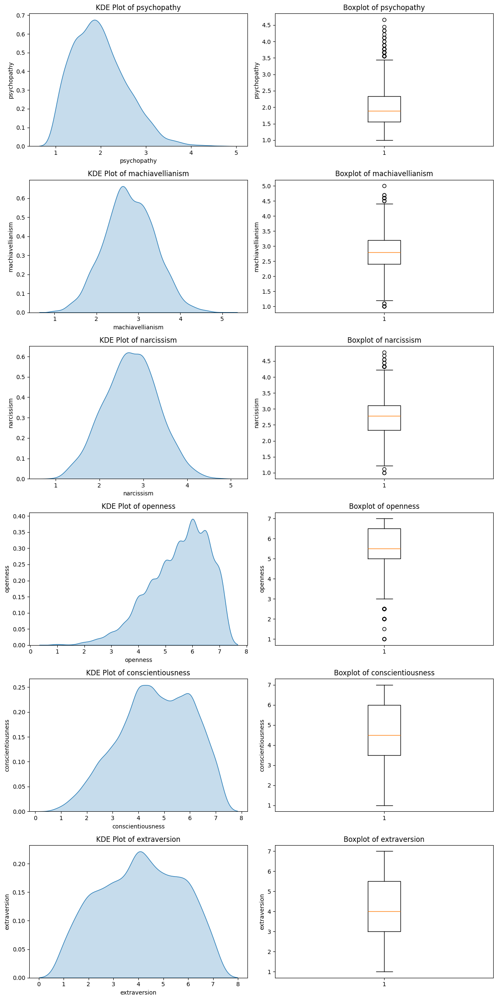

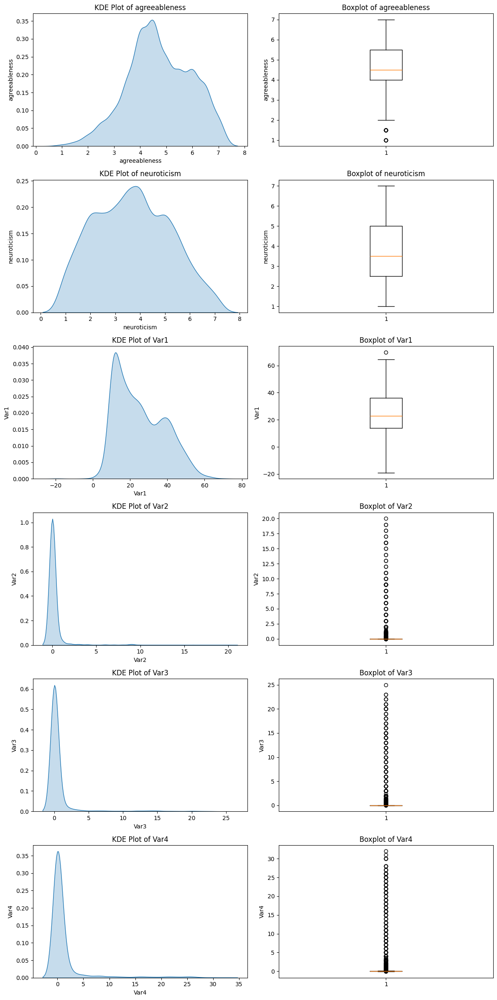

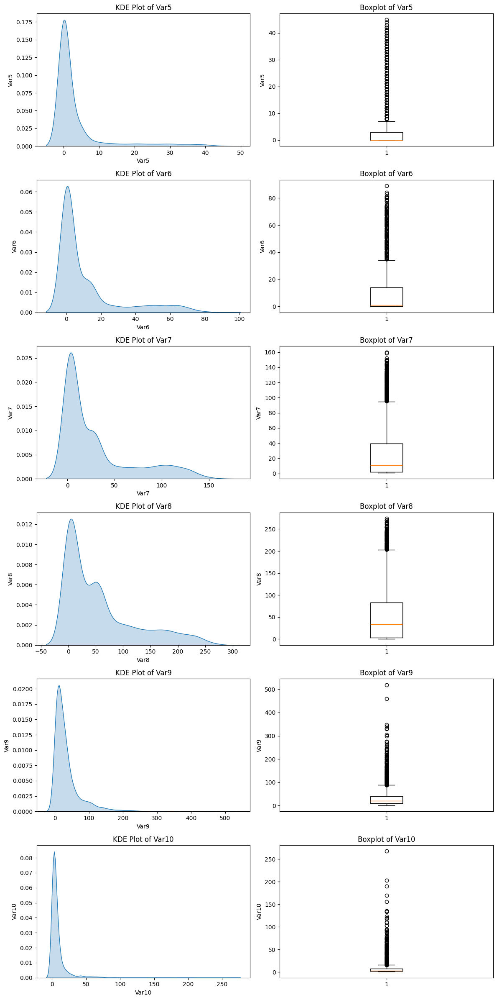

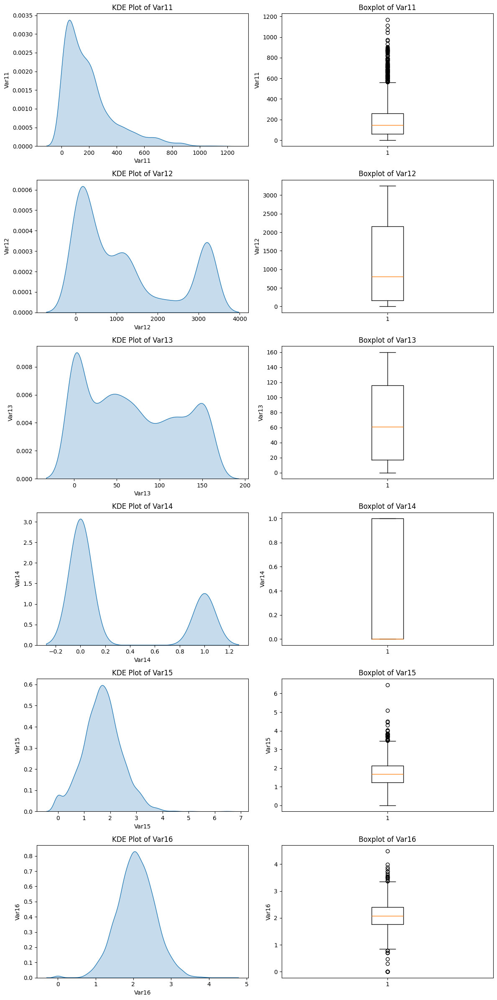

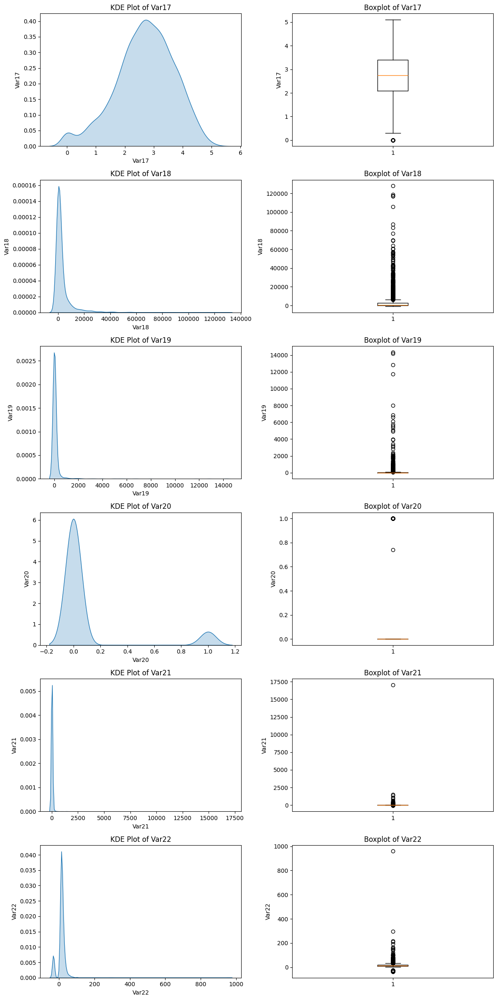

...

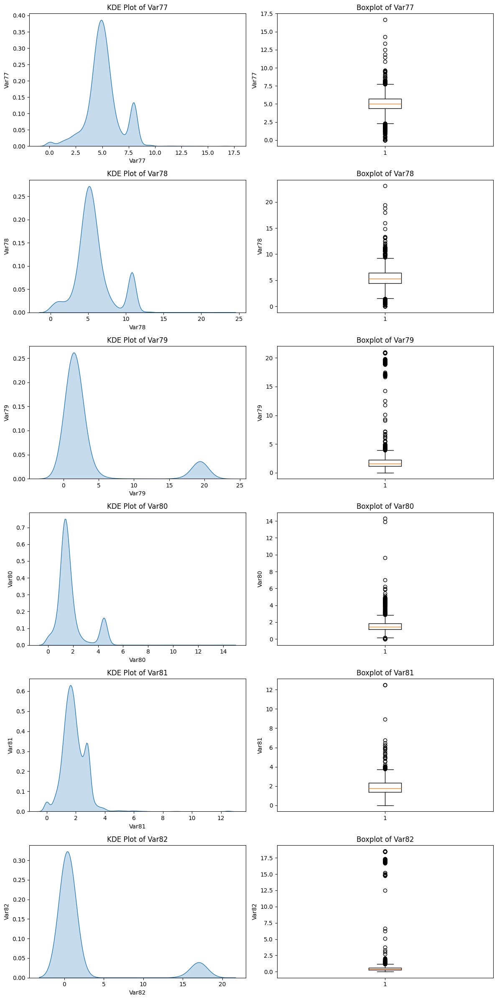

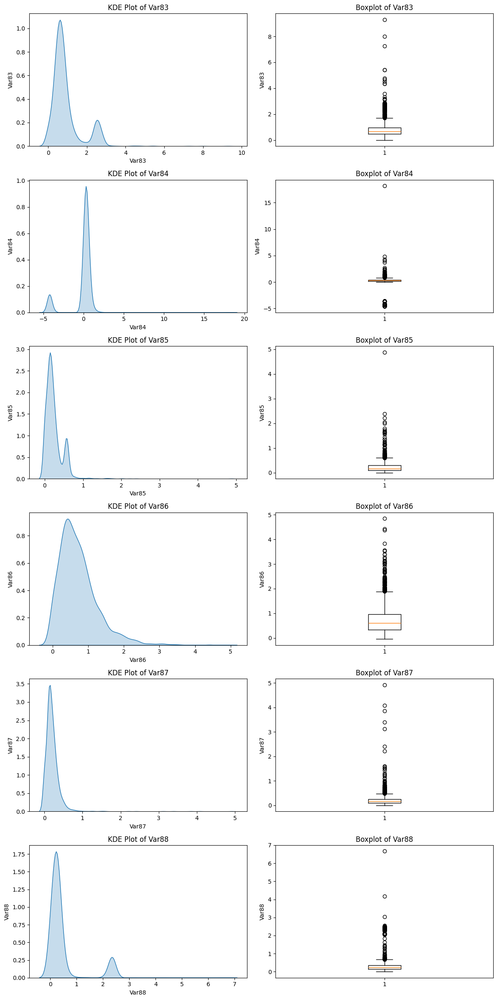

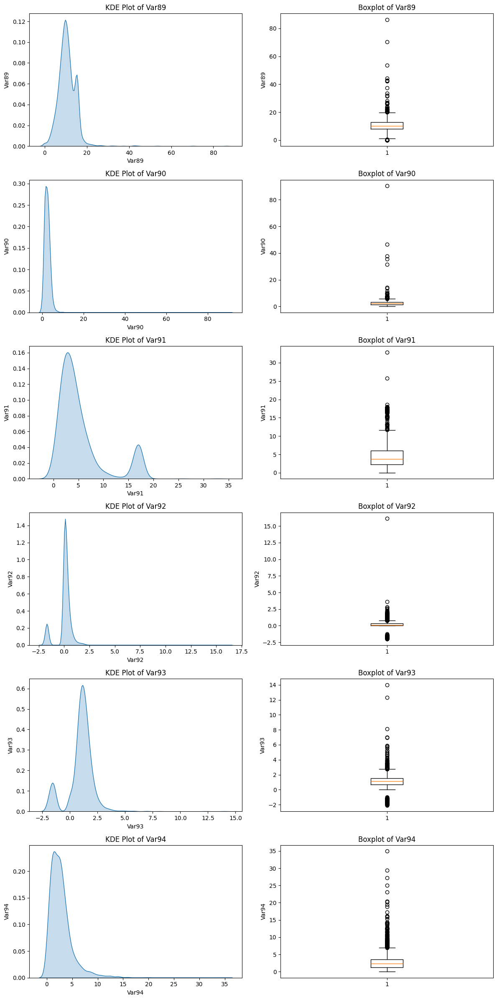

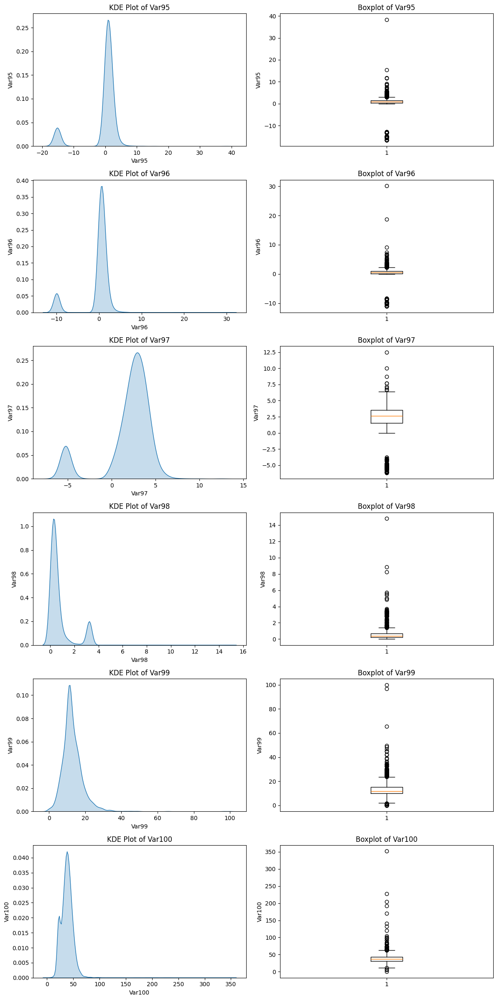

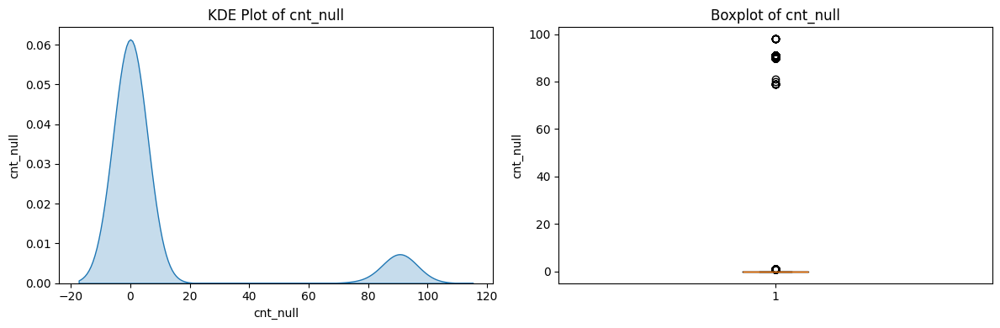

In [ ]:
cols = df_imputer.columns
cols_per_page = 6  # 한 페이지당 시각화할 변수 개수
num_pages = math.ceil(len(cols) / cols_per_page)

for i in range(num_pages):
    subset_cols = cols[i * cols_per_page : (i + 1) * cols_per_page]
    num_plots = len(subset_cols)

    fig, axs = plt.subplots(nrows=num_plots, ncols=2, figsize=(12, 4 * num_plots))

    if num_plots == 1:
        axs = [axs]  # 1개일 경우 [[ax1, ax2]] 형태로 변환

    for j, col in enumerate(subset_cols):
        sns.kdeplot(df_imputer[col].dropna(), ax=axs[j][0], fill=True)
        axs[j][0].set_title(f'KDE Plot of {col}')
        axs[j][0].set_ylabel(col)

        axs[j][1].boxplot(df_imputer[col].dropna())
        axs[j][1].set_title(f'Boxplot of {col}')
        axs[j][1].set_ylabel(col)

    plt.tight_layout()
    plt.show()


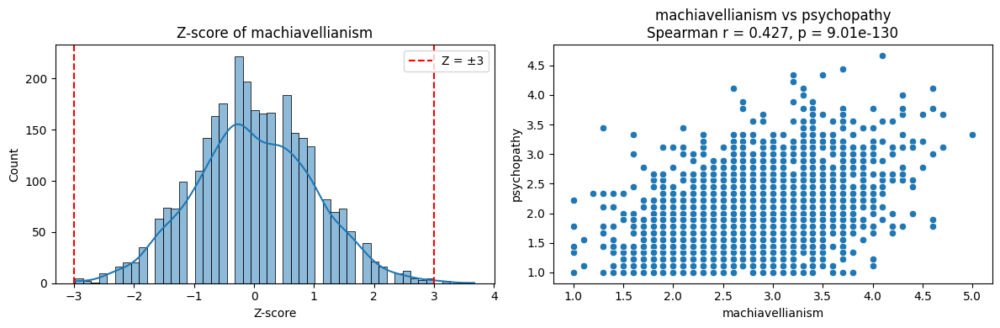

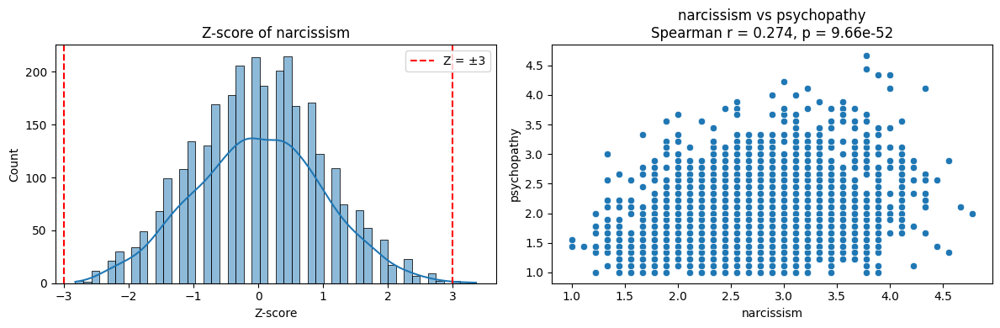

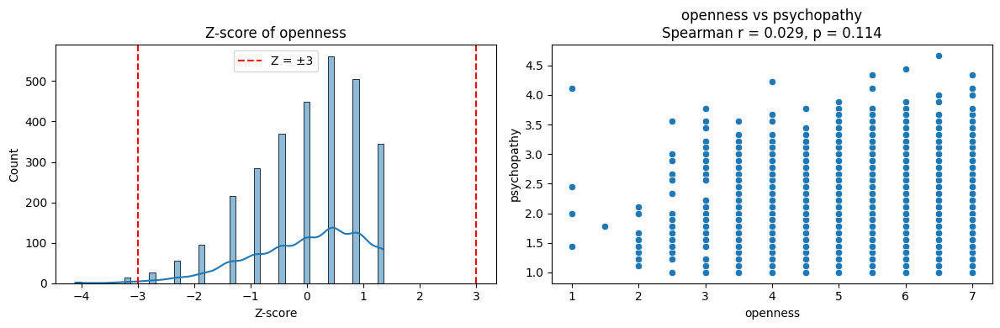

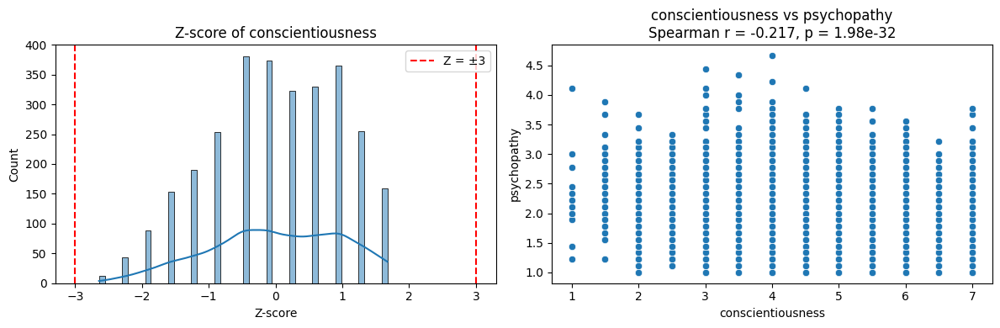

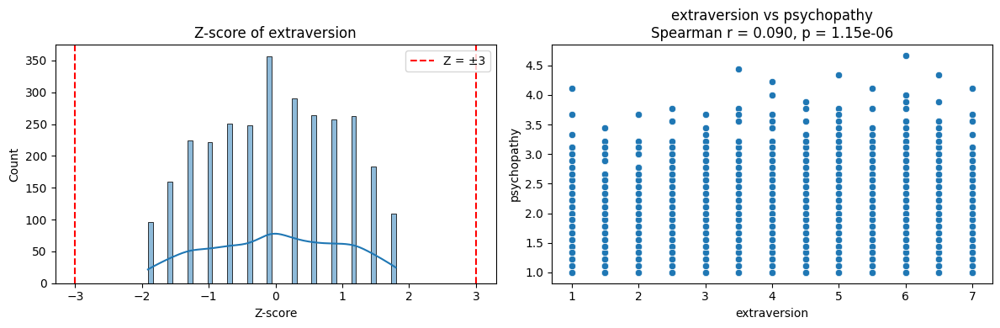

...

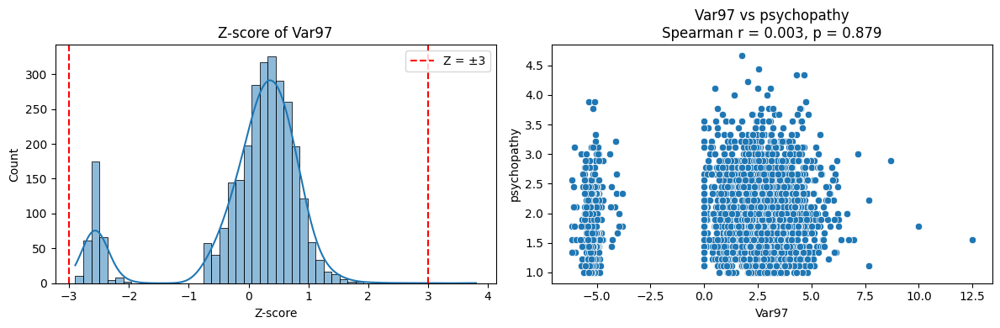

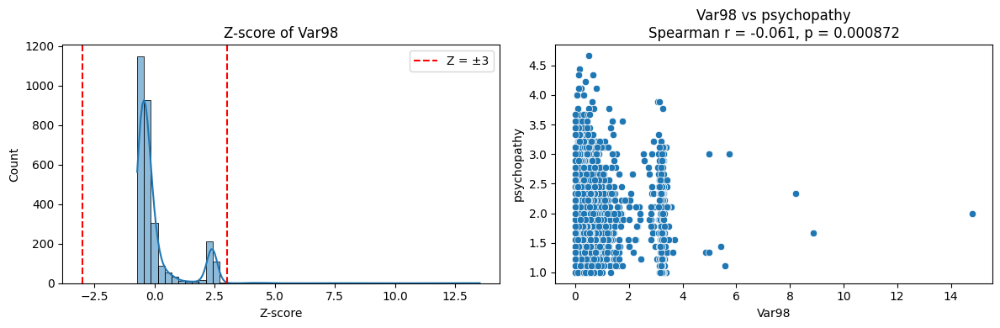

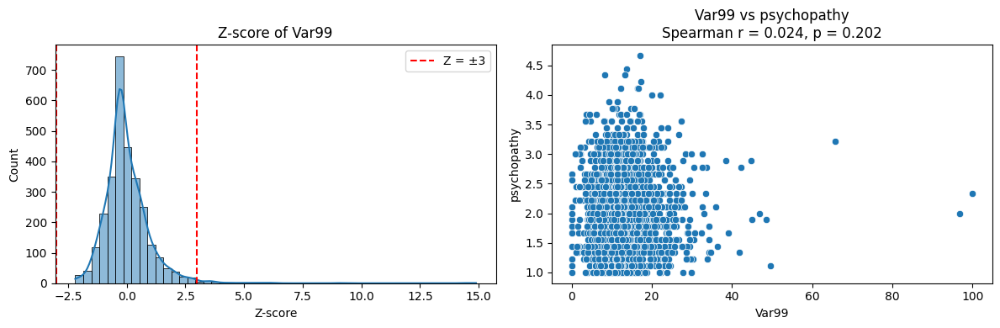

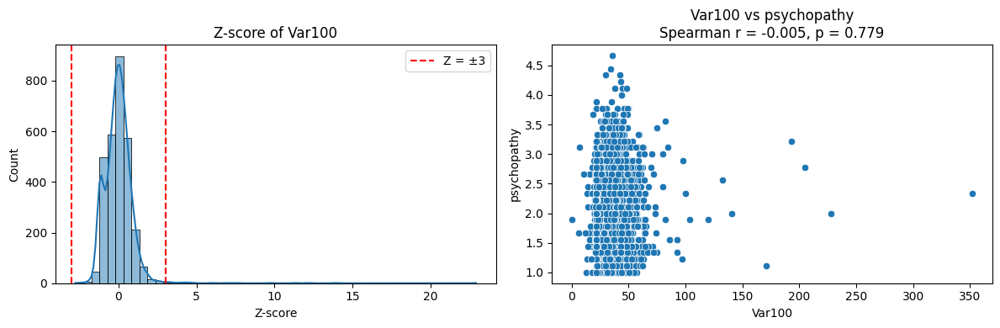

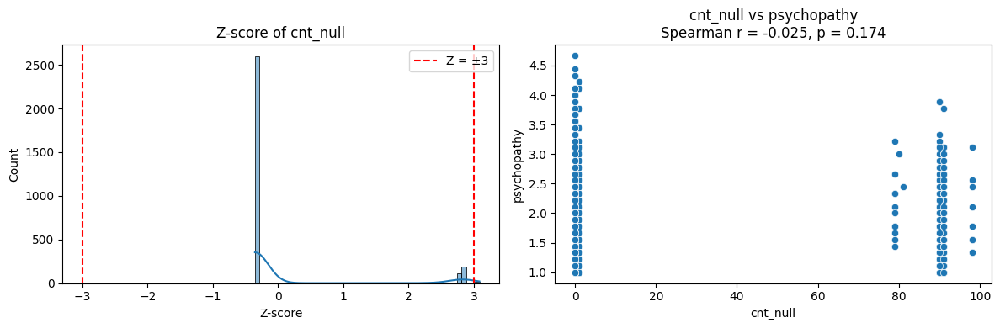

In [ ]:
target = 'psychopathy'
features = df_imputer.drop(target, axis=1).columns

for feature in features:
    # 결측 제거된 동일 인덱스 기준으로 정렬
    valid_data = df_imputer[[feature, target]].dropna()

    # Z-score 계산
    z_scores = zscore(valid_data[feature])

    # 스피어만 상관계수 계산
    coef, p_val = spearmanr(valid_data[feature], valid_data[target])

    # Z-score Plot
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(z_scores, kde=True, bins=50)
    plt.title(f"Z-score of {feature}")
    plt.xlabel("Z-score")
    plt.ylabel("Count")
    plt.axvline(x=3, color='red', linestyle='--', label='Z = ±3')
    plt.axvline(x=-3, color='red', linestyle='--')
    plt.legend()

    # Scatter Plot (feature vs target)
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=valid_data[feature], y=valid_data[target])
    plt.title(f"{feature} vs {target}\nSpearman r = {coef:.3f}, p = {p_val:.3g}")
    plt.xlabel(feature)
    plt.ylabel(target)

    plt.tight_layout()
    plt.show()


In [ ]:
for col in df_imputer.columns:
  stats , p = shapiro(df_imputer[col])
  result = "정규" if p > 0.05 else "비정규"
  print(f"{col} : 통계량 = {stats:.4f} , p : {p:.4f} > {result}")

psychopathy : 통계량 = 0.9662 , p : 0.0000 > 비정규
machiavellianism : 통계량 = 0.9969 , p : 0.0000 > 비정규
narcissism : 통계량 = 0.9958 , p : 0.0000 > 비정규
openness : 통계량 = 0.9353 , p : 0.0000 > 비정규
conscientiousness : 통계량 = 0.9682 , p : 0.0000 > 비정규
extraversion : 통계량 = 0.9660 , p : 0.0000 > 비정규
agreeableness : 통계량 = 0.9728 , p : 0.0000 > 비정규
neuroticism : 통계량 = 0.9717 , p : 0.0000 > 비정규
Var1 : 통계량 = 0.9418 , p : 0.0000 > 비정규
Var2 : 통계량 = 0.2074 , p : 0.0000 > 비정규
Var3 : 통계량 = 0.2724 , p : 0.0000 > 비정규
Var4 : 통계량 = 0.3521 , p : 0.0000 > 비정규
Var5 : 통계량 = 0.4841 , p : 0.0000 > 비정규
Var6 : 통계량 = 0.6559 , p : 0.0000 > 비정규
Var7 : 통계량 = 0.7521 , p : 0.0000 > 비정규
Var8 : 통계량 = 0.8138 , p : 0.0000 > 비정규
Var9 : 통계량 = 0.6764 , p : 0.0000 > 비정규
Var10 : 통계량 = 0.4280 , p : 0.0000 > 비정규
Var11 : 통계량 = 0.8486 , p : 0.0000 > 비정규
Var12 : 통계량 = 0.8180 , p : 0.0000 > 비정규
Var13 : 통계량 = 0.9117 , p : 0.0000 > 비정규
Var14 : 통계량 = 0.5696 , p : 0.0000 > 비정규
Var15 : 통계량 = 0.9904 , p : 0.0000 > 비정규
Var16 : 통계량 = 0.9940 , p : 0.00

In [ ]:
corf , p  = spearmanr(df_imputer['cnt_null'] , df_imputer['psychopathy'])
print(corf , p)

-0.025146926121298274 0.17378979918858722


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr

X = df_imputer.drop(columns=['psychopathy'])
y = df_imputer['psychopathy']

spearman_corrs = {}
for col in X.columns:
    coef, _ = spearmanr(X[col], y)
    spearman_corrs[col] = abs(coef)

# Series로 변환 및 정렬
corr_series = pd.Series(spearman_corrs).sort_values(ascending=False)

independent_features = corr_series[corr_series >= 0.05].index.tolist()

# 결과 확인
print(f"유지된 피처 수: {len(independent_features)} / 전체: {X.shape[1]}")


유지된 피처 수: 34 / 전체: 108


In [ ]:
independent_features = list(set(independent_features + ['cnt_null']))

In [ ]:
independent_features

['Var58',
 'Var94',
 'Var24',
 'Var46',
 'Var55',
 'narcissism',
 'Var81',
 'agreeableness',
 'Var14',
 'Var66',
 'Var10',
 'Var7',
 'Var22',
 'Var64',
 'Var23',
 'Var82',
 'conscientiousness',
 'machiavellianism',
 'Var86',
 'Var80',
 'Var41',
 'extraversion',
 'Var98',
 'Var53',
 'Var85',
 'Var92',
 'Var79',
 'Var78',
 'Var68',
 'Var29',
 'cnt_null',
 'Var52',
 'Var9',
 'Var51',
 'neuroticism']

In [ ]:
df_features = df_imputer[independent_features]

In [ ]:
corr = df_features.corr(numeric_only= True)

corr = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
corr.style.background_gradient(cmap='Blues')

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/style.py:3807: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/style.py:3808: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,Var58,Var94,Var24,Var46,Var55,narcissism,Var81,agreeableness,Var14,Var66,Var10,Var7,Var22,Var64,Var23,Var82,conscientiousness,machiavellianism,Var86,Var80,Var41,extraversion,Var98,Var53,Var85,Var92,Var79,Var78,Var68,Var29,cnt_null,Var52,Var9,Var51,neuroticism
Var58,nan,-0.094663,0.593884,0.458622,0.559152,-0.059944,0.154166,0.005606,-0.070289,0.303358,-0.007776,-0.019321,-0.379116,0.598277,0.491859,0.549046,-0.047672,-0.015844,-0.130295,0.573942,0.547577,-0.066346,0.414679,0.141043,0.184523,-0.426400,0.575019,0.507333,0.468838,0.028284,0.554018,0.111028,-0.046508,0.273327,0.096102
Var94,nan,nan,0.022115,0.040920,0.022082,-0.004691,0.081612,0.062690,-0.003160,0.100374,-0.073935,-0.111539,-0.026962,0.016031,-0.003191,0.033944,0.040245,0.014491,0.231601,0.018602,-0.104023,0.068757,0.049331,0.025952,0.015939,-0.016325,0.009765,0.113991,0.020382,-0.064566,0.029750,0.272703,-0.087157,0.245842,0.011635
Var24,nan,nan,nan,0.434435,0.437068,-0.092715,0.332405,0.023341,-0.077479,0.575059,-0.067938,-0.084513,-0.312422,0.526547,0.252644,0.411236,-0.027690,-0.012698,0.067867,0.454744,0.753714,-0.049752,0.233262,0.401635,0.031733,-0.383701,0.414597,0.665819,0.465085,0.113494,0.400907,0.412986,-0.102766,0.628200,0.120253
Var46,nan,nan,nan,nan,0.858784,-0.050247,0.346370,-0.034411,-0.011987,0.285152,0.018787,0.005314,-0.482709,0.778955,0.715422,0.821012,-0.062629,0.057862,-0.170948,0.613886,0.484357,-0.047998,0.664261,0.273501,0.436382,-0.664463,0.791221,0.599765,0.628016,-0.063782,0.805254,0.000775,-0.018417,0.296336,0.095460
Var55,nan,nan,nan,nan,nan,-0.064584,0.374716,-0.001078,-0.026021,0.332638,0.013444,-0.002407,-0.578360,0.959697,0.922923,0.989273,-0.004814,0.016493,-0.284444,0.793477,0.600991,-0.072417,0.828185,0.087431,0.525319,-0.810366,0.974516,0.726895,0.768455,-0.027353,0.989593,0.001074,-0.038340,0.236418,0.085001
narcissism,nan,nan,nan,nan,nan,nan,-0.010887,-0.056494,0.069736,-0.059020,0.041642,0.044159,0.033131,-0.061091,-0.050086,-0.065665,0.072446,0.136707,0.018234,-0.047254,-0.089324,0.451843,-0.070870,-0.037048,-0.029583,0.060094,-0.064040,-0.073294,-0.058491,0.041239,-0.062795,-0.036074,0.064351,-0.060566,-0.163829
Var81,nan,nan,nan,nan,nan,nan,nan,0.026052,-0.040321,0.317346,-0.105342,-0.111568,-0.252074,0.420793,0.334449,0.395667,0.075242,0.008635,-0.141491,0.354611,0.394440,-0.027072,0.314373,-0.066544,0.164440,-0.371061,0.398167,0.403450,0.343880,-0.000955,0.386212,0.233602,-0.145762,0.231396,-0.009649
agreeableness,nan,nan,nan,nan,nan,nan,nan,nan,-0.049435,0.054430,-0.003193,-0.029297,0.010010,0.024275,0.022626,0.015534,0.098007,-0.299132,0.002930,0.018170,0.041817,0.040581,0.011908,-0.089062,-0.035912,-0.023828,0.017193,0.031697,0.024118,0.043577,0.015745,0.145825,-0.018013,0.078388,-0.129757
Var14,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.055661,0.080096,0.153413,0.015394,-0.031064,-0.030948,-0.026223,-0.014308,0.033471,0.085896,-0.017466,-0.057208,0.064371,-0.000205,-0.036752,-0.006970,0.045243,-0.030381,-0.024731,-0.035547,-0.024781,-0.025302,-0.046553,0.120661,-0.062006,-0.006607
Var66,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.068102,-0.080925,-0.221759,0.398662,0.244315,0.325770,0.003892,-0.049960,0.024669,0.300549,0.471214,-0.069075,0.233830,0.140508,0.042166,-0.321735,0.312170,0.427270,0.557796,0.051228,0.327616,0.279428,-0.096558,0.369812,0.095170


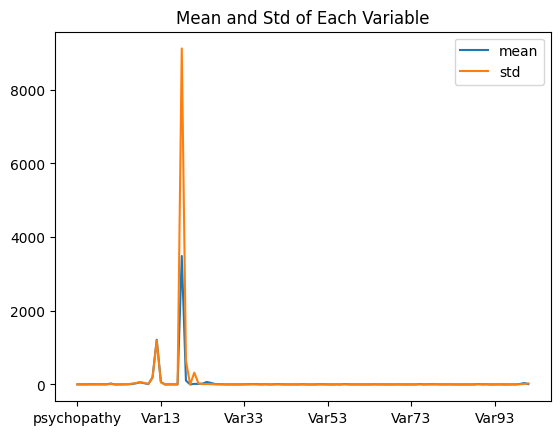

In [ ]:
df_imputer.mean().plot(kind = 'line' , label = 'mean')
df_imputer.std().plot(kind = 'line' , label = 'std')
plt.legend()
plt.title("Mean and Std of Each Variable")
plt.show()

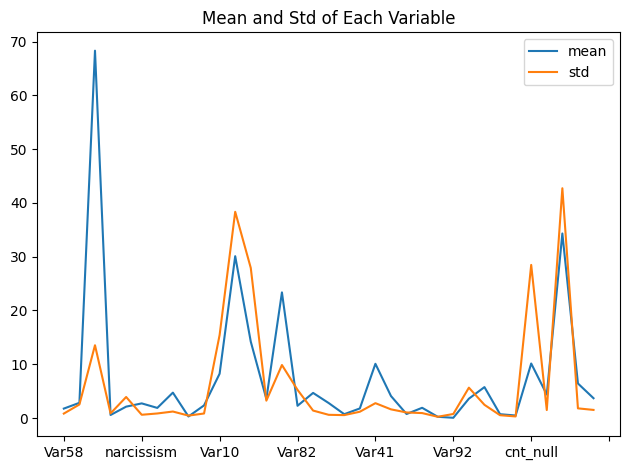

In [ ]:
df_features.mean().plot(kind = 'line' , label = 'mean')
df_features.std().plot(kind = 'line' , label = 'std')
plt.legend()
plt.title("Mean and Std of Each Variable")
plt.tight_layout()
plt.show()

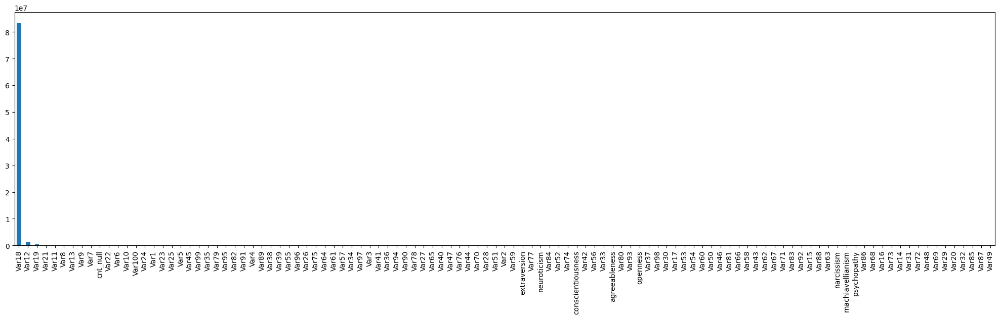

In [ ]:
df_imputer.var().sort_values(ascending = False).plot(kind = 'bar' , figsize = (25,6))
plt.show()

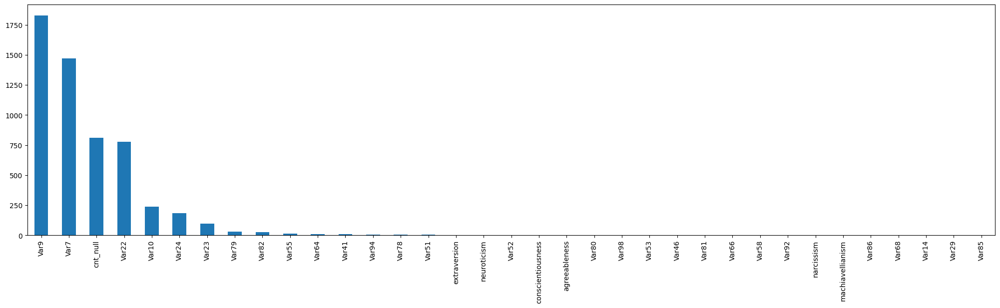

In [ ]:
df_features.var().sort_values(ascending = False).plot(kind = 'bar' , figsize = (25,6))
plt.show()

In [ ]:
def encode_strategy_selector(df_features,
                             low_cardinality_threshold=5,
                             high_cardinality_min=8,
                             skew_threshold=0.8,
                             verbose=False):
    onehot = []
    freq = []
    cont = []

    for col in df_features.columns:
        vals = df_features[col].dropna()
        unique_vals = vals.nunique()

        # 고유값 수가 작으면 명목형 -> 원핫 인코딩
        if unique_vals <= low_cardinality_threshold:
            onehot.append(col)
            continue

        # 고유값 수가 많고, 편향 판단을 위한 분포 체크
        if unique_vals >= high_cardinality_min:
            value_counts = vals.value_counts(normalize=True).values
            top3_ratio = value_counts[:3].sum()

            if top3_ratio > skew_threshold:
                freq.append(col)
                continue
            else:
                cont.append(col)
                continue

        # 그 외 애매한 경우 -> 기본적으로 연속형 취급
        cont.append(col)

    if verbose:
        print("원핫 인코딩 대상:", onehot)
        print("빈도/타겟 인코딩 대상:", freq)
        print("그대로 사용하는 연속형:", cont)

    return onehot, freq, cont


In [ ]:
onehot, freq, cont = encode_strategy_selector(df_features,
                                              low_cardinality_threshold=5,
                                              high_cardinality_min=8,
                                              skew_threshold=0.8,
                                              verbose=True)


원핫 인코딩 대상: ['Var14']
빈도/타겟 인코딩 대상: ['cnt_null']
그대로 사용하는 연속형: ['Var58', 'Var94', 'Var24', 'Var46', 'Var55', 'narcissism', 'Var81', 'agreeableness', 'Var66', 'Var10', 'Var7', 'Var22', 'Var64', 'Var23', 'Var82', 'conscientiousness', 'machiavellianism', 'Var86', 'Var80', 'Var41', 'extraversion', 'Var98', 'Var53', 'Var85', 'Var92', 'Var79', 'Var78', 'Var68', 'Var29', 'Var52', 'Var9', 'Var51', 'neuroticism']


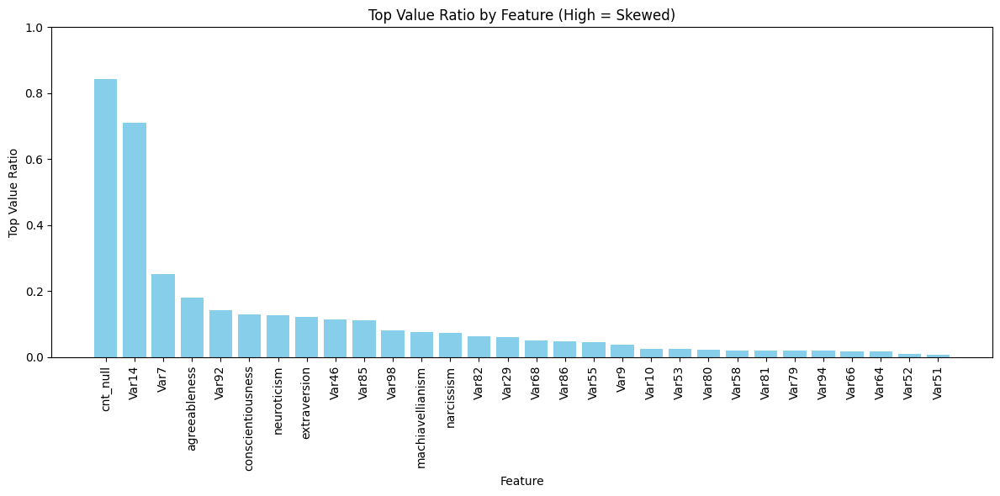

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



# 시각화 함수: 각 변수의 최빈값 비율 시각화
def plot_extreme_skewness(df_features, top_k=30):
    skew_info = []
    for col in df_features.columns:
        if df_features[col].dtype in ['float64', 'int64'] and df_imputer[col].nunique() > 1:
            vc = df_features[col].value_counts(normalize=True, dropna=False)
            top_ratio = vc.iloc[0]
            skew_info.append((col, top_ratio, len(vc)))
    skew_df = pd.DataFrame(skew_info, columns=['Feature', 'TopValueRatio', 'UniqueCount'])
    skew_df = skew_df.sort_values(by='TopValueRatio', ascending=False).head(top_k)

    plt.figure(figsize=(12, 6))
    bars = plt.bar(skew_df['Feature'], skew_df['TopValueRatio'], color='skyblue')
    plt.xticks(rotation=90)
    plt.ylim(0, 1)
    plt.title('Top Value Ratio by Feature (High = Skewed)')
    plt.ylabel('Top Value Ratio')
    plt.xlabel('Feature')
    plt.tight_layout()
    plt.show()

plot_extreme_skewness(df_features)


In [ ]:
df_cont = df_features[cont]
df_freq = df_features[freq]
df_onehot = df_features[onehot]

# X = df_cont.drop('psychopathy', axis = 1)
# y = df_cont['psychopathy']
X = df_cont


In [ ]:
# z_score = X.apply(zscore)

# mask = (z_score.abs() < 3).all(axis = 1)


# X_clean = X[mask]
# y_clean = y[mask]

# print(f"제거 전 샘플 수: {len(data)}, 제거 후 샘플 수: {len(X_clean)}")

In [ ]:
# from scipy.stats import iqr

# X = df_cont.drop('psychopathy', axis=1)
# y = df_cont['psychopathy']

# # IQR 계산
# Q1 = X.quantile(0.25)
# Q3 = X.quantile(0.75)
# IQR = Q3 - Q1

# # 이상치 마스크: IQR 1.5 범위 안에 있는 데이터만 선택
# mask = ~((X < (Q1 - 2.5 * IQR)) | (X > (Q3 + 2.5 * IQR))).any(axis=1)

# # 이상치 제거한 데이터셋
# X_clean = X[mask]
# y_clean = y[mask]

# print(f"제거 전 샘플 수: {len(X)}")
# print(f"제거 후 샘플 수: {len(X_clean)}")


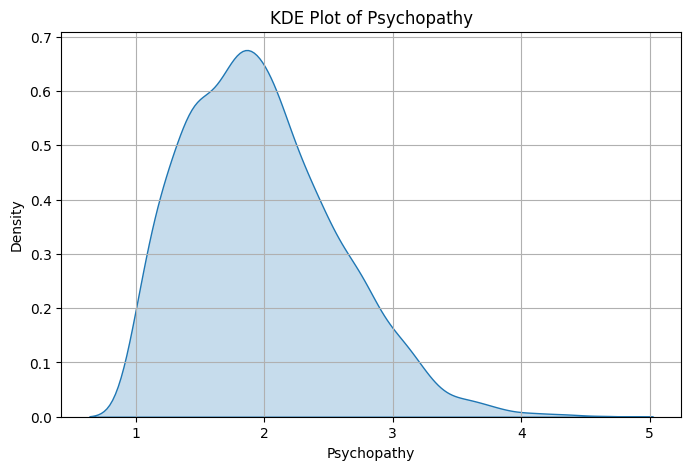

In [ ]:
plt.figure(figsize=(8, 5))
sns.kdeplot(y ,fill=True)
plt.title('KDE Plot of Psychopathy')
plt.xlabel('Psychopathy')
plt.ylabel('Density')
plt.grid(True)
plt.show()


In [ ]:
scaler = MinMaxScaler()
X_cnt_scaled =  pd.DataFrame(
    scaler.fit_transform(X),
    columns = X.columns,
    index = X.index
    )

In [ ]:
print(X_cnt_scaled.shape)

(2927, 33)


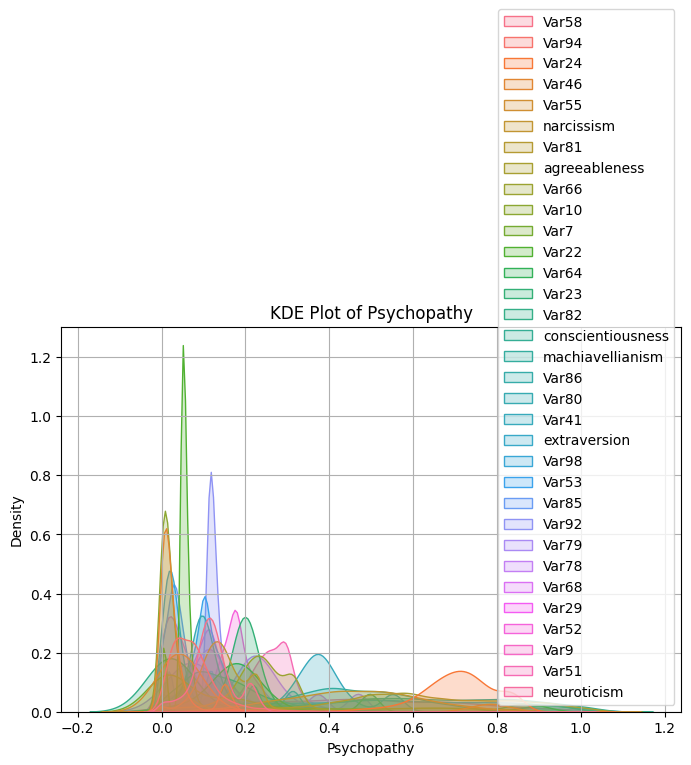

In [ ]:
plt.figure(figsize=(8, 5))
sns.kdeplot(X_cnt_scaled ,fill=True)
plt.title('KDE Plot of Psychopathy')
plt.xlabel('Psychopathy')
plt.ylabel('Density')
plt.grid(True)
plt.show()


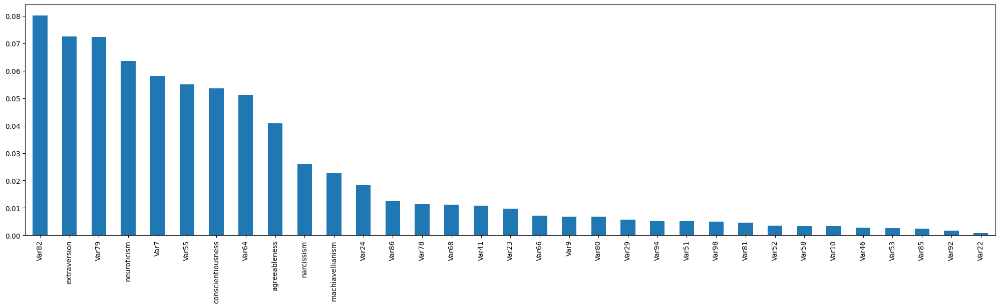

In [ ]:
X_cnt_scaled.var().sort_values(ascending = False).plot(kind = 'bar' , figsize = (25,6))
plt.show()

In [ ]:
 # 원-핫 인코딩
from sklearn.preprocessing import OneHotEncoder
from scipy.sparse import csr_matrix, hstack


df_onehot = df_onehot.loc[X.index]

encoder = OneHotEncoder(sparse_output=True, handle_unknown='ignore')
encoded_sparse = encoder.fit_transform(df_onehot)

print(type(encoded_sparse))  # <class 'scipy.sparse._csr.csr_matrix'>
print(encoded_sparse.shape)

<class 'scipy.sparse._csr.csr_matrix'>
(2927, 2)


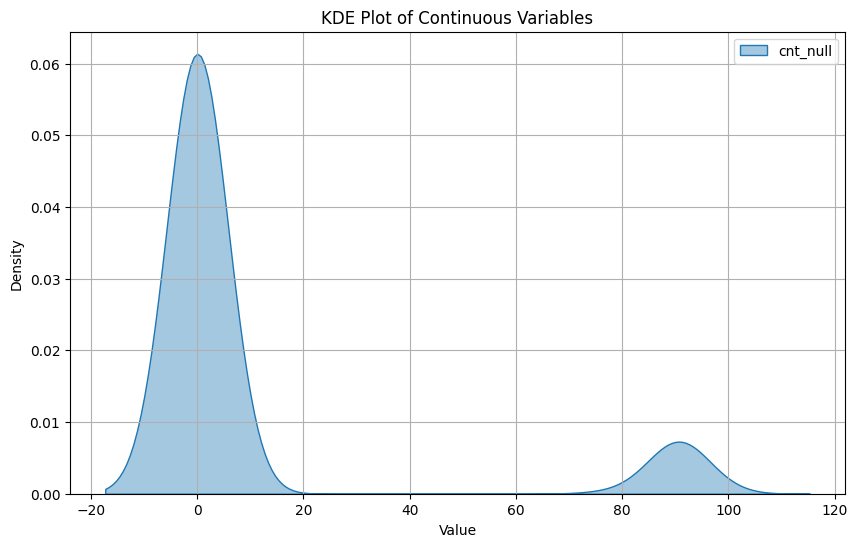

In [ ]:
plt.figure(figsize=(10, 6))
for col in df_freq:
    sns.kdeplot(df_freq[col], label=col, fill=True, alpha=0.4)

plt.title('KDE Plot of Continuous Variables')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# 빈도 인코딩
df_freq = df_freq.loc[X.index]

df_freq_encoded = df_freq.copy()

for col in df_freq.columns:
    freq_map = df_freq[col].value_counts(normalize=True)
    df_freq_encoded[col] = df_freq[col].map(freq_map)

print(df_freq_encoded.shape)

(2927, 1)


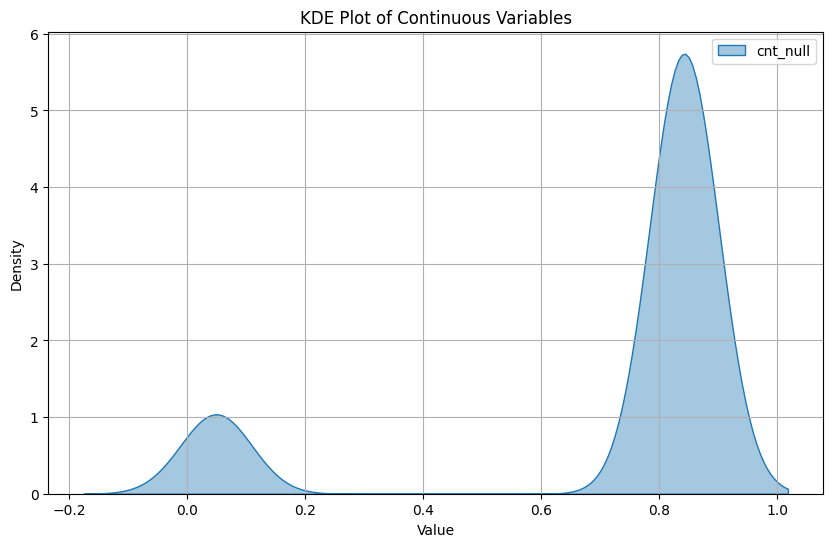

In [ ]:
plt.figure(figsize=(10, 6))
for col in df_freq_encoded:
    sns.kdeplot(df_freq_encoded[col], label=col, fill=True, alpha=0.4)

plt.title('KDE Plot of Continuous Variables')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# 셋 다 합치기
# X_clean + df_onehot + df_freq_encoded

X_continuous = csr_matrix(X_cnt_scaled.values)
X_freq = csr_matrix(df_freq_encoded.values)
X_final_sparse = hstack([X_continuous, encoded_sparse,X_freq])


print(X_final_sparse.shape)
print(type(X_final_sparse))

(2927, 36)
<class 'scipy.sparse._csr.csr_matrix'>


In [ ]:
X_train , X_test , y_train , y_test = train_test_split(
    X_final_sparse,
    y,
    random_state= 42,
    test_size = 0.2
)

In [ ]:
lr = LinearRegression()

lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)


print("LinearReg RMSE:",np.sqrt(mean_squared_error(y_test, y_pred)))
print("LinearReg R²:", r2_score(y_test, y_pred))
print("LinearReg RMSLE:" , np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("LinearReg MAE:" , mean_absolute_error(y_test, y_pred))
print("LinearReg MSE:" ,mean_squared_error(y_test, y_pred))


LinearReg RMSE: 0.47108286475851363
LinearReg R²: 0.3869862197360645
LinearReg RMSLE: 0.15561214135065904
LinearReg MAE: 0.37377172991000024
LinearReg MSE: 0.22191906546908804


In [ ]:
from sklearn.preprocessing import MaxAbsScaler
from sklearn.linear_model import LassoCV
from sklearn.pipeline import make_pipeline
import numpy as np

alphas = np.logspace(-4, 1, 50)

pipeline = make_pipeline(
    MaxAbsScaler(),
    LassoCV(alphas=alphas,
            cv=5,
            max_iter=10000,
            random_state=42)
)

pipeline.fit(X_train, y_train)
best_alpha = pipeline.named_steps['lassocv'].alpha_
print("최적 α:", best_alpha)

y_pred = pipeline.predict(X_test)


print("Lasso RMSE:",np.sqrt(mean_squared_error(y_test, y_pred)))
print("R²:", r2_score(y_test, y_pred))
print("RMSLE:" ,  np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("MAE:" , mean_absolute_error(y_test, y_pred))
print("MSE:" ,mean_squared_error(y_test, y_pred))

최적 α: 0.0006551285568595509
Lasso RMSE: 0.4740575886040925
R²: 0.37921983986057417
RMSLE: 0.15637669267659646
MAE: 0.37437428920303695
MSE: 0.224730597313127


In [ ]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler


selector = SelectFromModel(
    estimator=Lasso(alpha=best_alpha, max_iter=10000, random_state=42),
    threshold="median"
)

pipe = make_pipeline(
    MaxAbsScaler(),
    selector

)

pipe.fit(X_train, y_train)
X_train_sel = pipe.transform(X_train)
X_test_sel  = pipe.transform(X_test)

print("원본 피처 개수:", X_train.shape[1])
print("선택된 피처 개수:", X_train_sel.shape[1])


원본 피처 개수: 36
선택된 피처 개수: 18


In [ ]:
lr = LinearRegression()
lr.fit(X_train_sel, y_train)
y_pred_sel = lr.predict(X_test_sel)


print("R²:", r2_score(y_test, y_pred_sel))
print("RMSE:",np.sqrt(mean_squared_error(y_test, y_pred_sel)))
print("RMSLE:" , np.sqrt(mean_squared_log_error(y_test, y_pred_sel)))
print("MAE:" , mean_absolute_error(y_test, y_pred_sel))
print("MSE:" ,mean_squared_error(y_test, y_pred_sel))


R²: 0.3657519305446817
RMSE: 0.479172367668903
RMSLE: 0.15813912851771877
MAE: 0.37699277766202827
MSE: 0.22960615793742234


In [ ]:
svr = SVR(kernel= 'rbf' , C= 1.0 , epsilon= 0.1)

svr.fit(X_train , y_train)
y_pred = svr.predict(X_test)

print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("r2:" ,r2_score(y_test , y_pred))
print("RMSLE:" , np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("MAE:" , mean_absolute_error(y_test, y_pred))
print("MSE:" ,mean_squared_error(y_test, y_pred))

RMSE: 0.4776438161287369
r2: 0.36979195712031365
RMSLE: 0.1567308902234584
MAE: 0.37916717908599096
MSE: 0.22814361508602263


In [ ]:
from xgboost import XGBRegressor

xgb = XGBRegressor(n_estimators=200, learning_rate=0.1,
                   max_depth=4, random_state=42)
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)



print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("XGB R²:", r2_score(y_test, y_pred))
print("RMSLE:" , np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("MAE:" , mean_absolute_error(y_test, y_pred))
print("MSE:" ,mean_squared_error(y_test, y_pred))


RMSE: 0.4814219466342117
XGB R²: 0.35978272028533753
RMSLE: 0.1580283381972664
MAE: 0.37846478078526447
MSE: 0.23176709070107374


In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(max_depth=9,
                           random_state=42)

rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)


print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2:", r2_score(y_test, y_pred))
print("RMSLE:" , np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("MAE:" , mean_absolute_error(y_test, y_pred))
print("MSE:" ,mean_squared_error(y_test, y_pred))

RMSE: 0.4804117444578837
R2: 0.3624667289144934
RMSLE: 0.15822771771404726
MAE: 0.3804797229340688
MSE: 0.23079544421306694


In [ ]:
from sklearn.ensemble import VotingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_squared_error


estimators = [
    ('xgb', XGBRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_alpha=0.1,
        reg_lambda=1.0,
        random_state=42
    )),
    ('rf', RandomForestRegressor(
        n_estimators=300,
        max_depth=10,
        min_samples_leaf=5,
        max_features='sqrt',
        random_state=42
    )),
    ('svr', SVR(
        kernel='rbf',
        C=10.0,
        epsilon=0.05,
        gamma='scale'
    ))
]


voter = VotingRegressor(estimators=estimators, weights=[3,2,1])


voter.fit(X_train, y_train)
y_pred = voter.predict(X_test)

print("Voting RMSE:" ,np.sqrt(mean_squared_error(y_test, y_pred)))
print("Voting R² :", r2_score(y_test, y_pred))


Voting RMSE: 0.47088211283143927
Voting R² : 0.3875085799623549


In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR

base_estimators = [
    ('rf', RandomForestRegressor(n_estimators=300, max_depth=10, min_samples_leaf=5, max_features='sqrt', random_state=42)),
    ('xgb', XGBRegressor(n_estimators=300, learning_rate=0.05, max_depth=6, subsample=0.8, colsample_bytree=0.8, reg_alpha=0.1, reg_lambda=1.0, random_state=42)),
    ('svr', SVR(kernel='rbf', C=10.0, epsilon=0.05, gamma='scale'))
]


meta_estimator = RidgeCV(alphas=np.logspace(-3, 2, 10), cv=5)

stack = StackingRegressor(
    estimators=base_estimators,
    final_estimator=meta_estimator,
    cv=5,
    passthrough=True
)

stack.fit(X_train, y_train)
y_pred_stack = stack.predict(X_test)

print("Stacking R² :", r2_score(y_test, y_pred_stack))
print("Stacking RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))



Stacking R² : 0.40028899609207647
Stacking RMSE: 0.47088211283143927


In [ ]:
mlp = make_pipeline(
    MaxAbsScaler(),
    MLPRegressor(
        hidden_layer_sizes=(128, 64, 32),
        activation='relu',
        solver='adam',
        max_iter=3000,
        early_stopping=True,
        validation_fraction=0.1,
        random_state=42
    )
)

mlp.fit(X_train, y_train)
y_pred = mlp.predict(X_test)

print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("MLP R²:", r2_score(y_test, y_pred))
print("RMSLE:" , np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("MAE:" , mean_absolute_error(y_test, y_pred))
print("MSE:" ,mean_squared_error(y_test, y_pred))

RMSE: 0.47532472715790275
MLP R²: 0.37589675933570554
RMSLE: 0.15712958667126287
MAE: 0.37597951876566926
MSE: 0.2259335962477347


In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_squared_log_error
import numpy as np

poly_pipe = make_pipeline(
    PolynomialFeatures(degree=2, include_bias=False, interaction_only=True),
    MaxAbsScaler(),
    Ridge(alpha=1.0)
)

poly_pipe.fit(X_train, y_train)
y_pred = poly_pipe.predict(X_test)

print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R²:", r2_score(y_test, y_pred))
print("RMSLE:", np.sqrt(mean_squared_log_error(y_test, y_pred)))
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))


RMSE: 0.47370961968325115
R²: 0.3801308385606873
RMSLE: 0.15617895721781502
MAE: 0.37705968551038443
MSE: 0.22440080378045044
